In [124]:
import os
from collections import defaultdict

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from PIL import Image
from tqdm import tqdm

In [125]:
image_dir = "../data/processed/labeled/"

In [126]:
def get_image_files(image_dir):
    image_files = []
    subdirectories = []

    for root, dirs, files in os.walk(image_dir):
        for file in files:
            if file.endswith(".jpg"):
                image_files.append(os.path.join(root, file))

        subdirectories.append(root)

    print(f"Total number of images: {len(image_files)}")
    return image_files, subdirectories

In [127]:
image_files, subdirectories = get_image_files(image_dir)

Total number of images: 812


## Image Size Analysis


In [128]:
sizes = []
aspect_ratios = []

In [129]:
def analyze_image_sizes(image_dir):
    """Analyzes image sizes and aspect ratios in a directory and its subdirectories.

    Args:
        image_dir (str): The directory containing image files.

    Returns:
        tuple: A tuple containing three lists:
            - widths (list): A list of image widths.
            - heights (list): A list of image heights.
            - aspect_ratios (list): A list of image aspect ratios.
    """

    image_files = []
    subdirectories = []
    sizes = []
    aspect_ratios = []

    for root, dirs, files in os.walk(image_dir):
        for file in files:
            if file.endswith(".jpg"):
                image_files.append(os.path.join(root, file))
                subdirectories.append(root)

    print(f"Total number of images: {len(image_files)}")

    with tqdm(image_files, desc="Analyzing image sizes") as progress_bar:
        for img_file in progress_bar:
            try:
                with Image.open(img_file) as img:
                    width, height = img.size
                    sizes.append((width, height))
                    aspect_ratios.append(width / height)
            except (IOError, OSError) as e:
                print(f"Error opening image: {img_file} - {e}")

    widths, heights = zip(*sizes)
    return widths, heights, aspect_ratios

In [130]:
widths, heights, aspect_ratios = analyze_image_sizes(image_dir)

Total number of images: 812


Analyzing image sizes:   2%|▏         | 19/812 [00:00<00:08, 91.02it/s]

Analyzing image sizes: 100%|██████████| 812/812 [00:07<00:00, 107.59it/s]


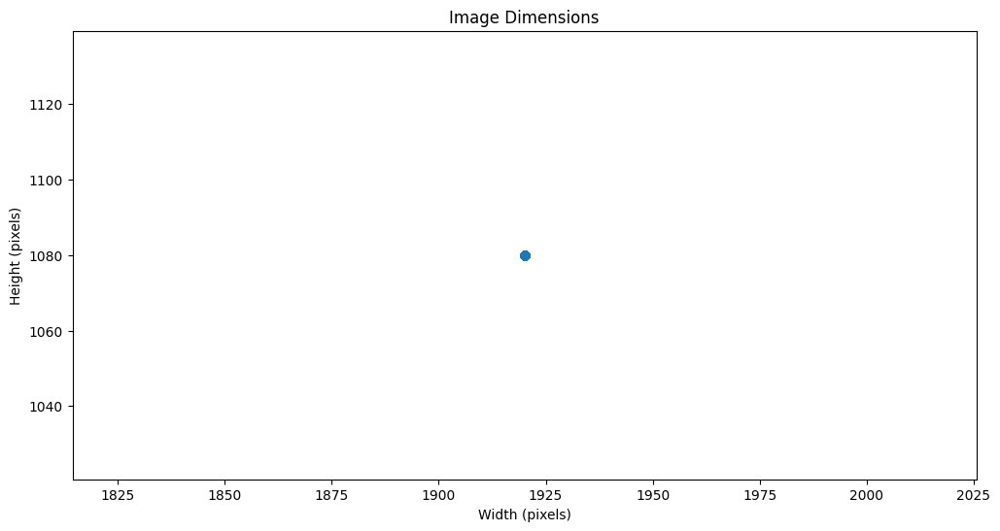

In [131]:
plt.figure(figsize=(12, 6))
plt.scatter(widths, heights, alpha=0.5)

plt.title("Image Dimensions")
plt.xlabel("Width (pixels)")
plt.ylabel("Height (pixels)")

plt.show()

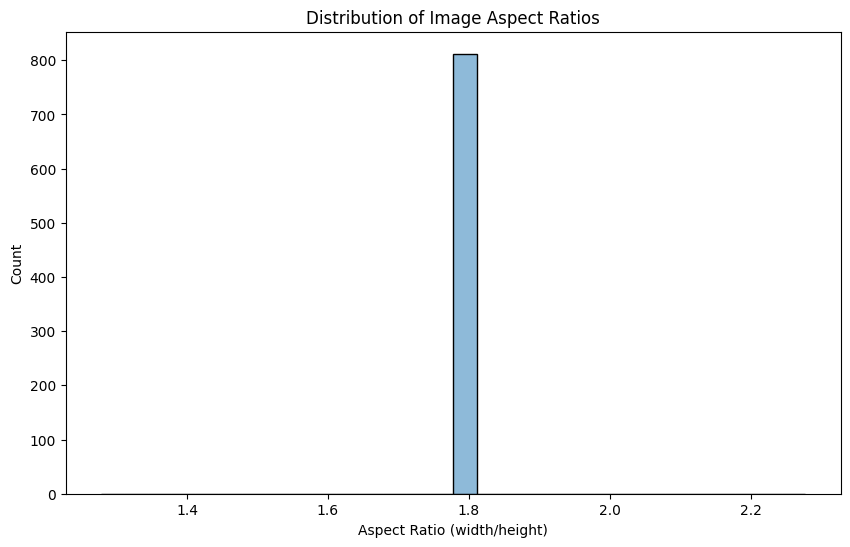

In [132]:
plt.figure(figsize=(10, 6))
sns.histplot(aspect_ratios, bins=30, kde=True)

plt.title("Distribution of Image Aspect Ratios")
plt.xlabel("Aspect Ratio (width/height)")

plt.show()

In [133]:
print(f"Average image size: {np.mean(widths):.0f}x{np.mean(heights):.0f}")
print(f"Median image size: {np.median(widths):.0f}x{np.median(heights):.0f}")
print(f"Size range: {min(widths)}x{min(heights)} to {max(widths)}x{max(heights)}")

Average image size: 1920x1080
Median image size: 1920x1080
Size range: 1920x1080 to 1920x1080


## Color Analysis


In [134]:
def get_average_color(img):
    return tuple(int(x) for x in np.mean(np.array(img), axis=(0, 1)))

In [135]:
avg_colors = []

In [136]:
def analyze_image_colors(image_dir, get_average_color_func):
    """Analyzes average colors of image files in a directory and its subdirectories.

    Args:
        image_dir (str): The directory containing image files.
        get_average_color_func (callable): A function that takes an Image object and
                                             returns a tuple representing the average color.

    Returns:
        tuple: A tuple containing three lists:
            - avg_r (list): A list of average red channel values.
            - avg_g (list): A list of average green channel values.
            - avg_b (list): A list of average blue channel values.
    """

    image_files = []
    avg_colors = []

    for root, dirs, files in os.walk(image_dir):
        for file in files:
            if file.endswith(".jpg"):
                image_files.append(os.path.join(root, file))

    print(f"Total number of images: {len(image_files)}")

    with tqdm(image_files, desc="Analyzing image colors") as progress_bar:
        for img_file in progress_bar:
            try:
                with Image.open(img_file) as img:
                    avg_color = get_average_color_func(img)
                    avg_colors.append(avg_color)
            except (IOError, OSError) as e:
                print(f"Error opening image: {img_file} - {e}")

    avg_r, avg_g, avg_b = zip(*avg_colors)
    return avg_r, avg_g, avg_b


def get_average_color(img):
    return tuple(int(x) for x in np.mean(np.array(img), axis=(0, 1)))

In [137]:
avg_r, avg_g, avg_b = analyze_image_colors(image_dir, get_average_color)

Total number of images: 812


Analyzing image colors:   0%|          | 2/812 [00:00<00:54, 14.88it/s]

Analyzing image colors: 100%|██████████| 812/812 [00:42<00:00, 19.13it/s]


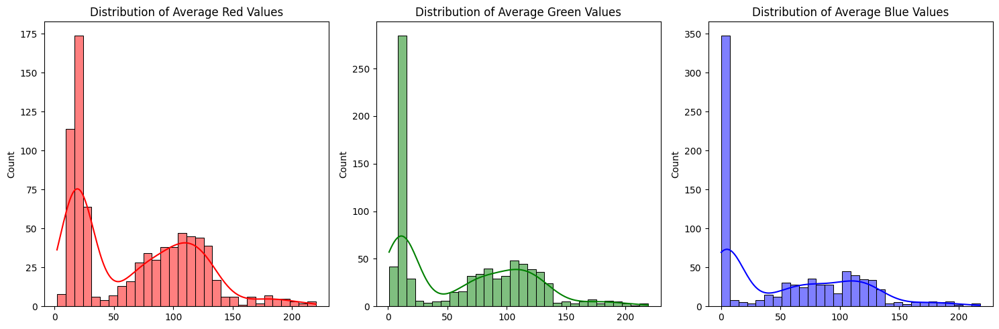

In [138]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
sns.histplot(avg_r, bins=30, color="red", kde=True)
plt.title("Distribution of Average Red Values")

plt.subplot(1, 3, 2)
sns.histplot(avg_g, bins=30, color="green", kde=True)
plt.title("Distribution of Average Green Values")

plt.subplot(1, 3, 3)
sns.histplot(avg_b, bins=30, color="blue", kde=True)
plt.title("Distribution of Average Blue Values")

plt.tight_layout()
plt.show()

## Brightness Analysis


In [139]:
def analyze_image_brightness(image_dir):
    """Analyzes the brightness of image files in a directory and its subdirectories.

    Args:
        image_dir (str): The directory containing image files.

    Returns:
        list: A list of image brightness values.
    """

    image_files = []
    brightness_values = []

    for root, dirs, files in os.walk(image_dir):
        for file in files:
            if file.endswith(".jpg"):
                image_files.append(os.path.join(root, file))

    print(f"Total number of images: {len(image_files)}")

    with tqdm(image_files, desc="Analyzing image brightness") as progress_bar:
        for img_file in progress_bar:
            try:
                with Image.open(img_file) as img:
                    gray_img = img.convert("L")
                    brightness = sum(gray_img.getdata()) / (
                        gray_img.width * gray_img.height
                    )

                    brightness_values.append(brightness)
            except (IOError, OSError) as e:
                print(f"Error opening image: {img_file} - {e}")

    return brightness_values

In [140]:
brightness_values = analyze_image_brightness(image_dir)

Total number of images: 812


Analyzing image brightness:   0%|          | 0/812 [00:00<?, ?it/s]

Analyzing image brightness: 100%|██████████| 812/812 [00:34<00:00, 23.44it/s]


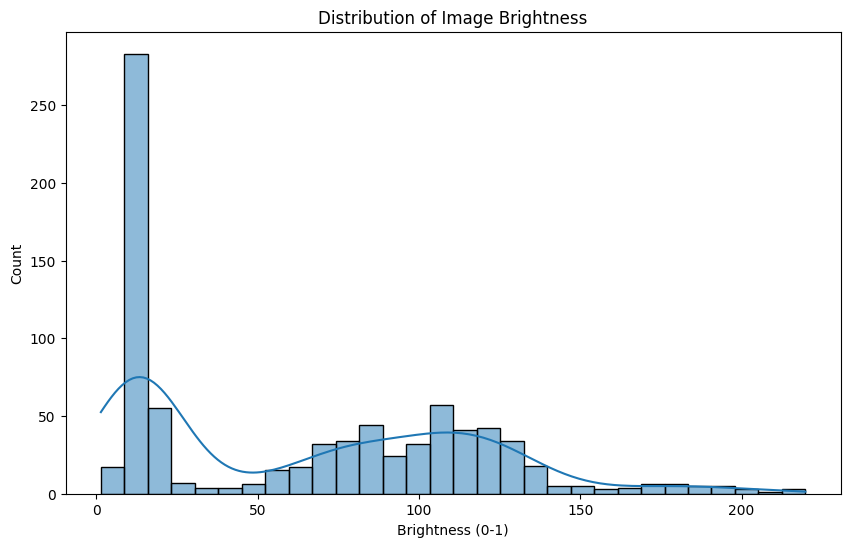

In [141]:
plt.figure(figsize=(10, 6))
sns.histplot(brightness_values, bins=30, kde=True)
plt.title("Distribution of Image Brightness")
plt.xlabel("Brightness (0-1)")
plt.show()

In [142]:
print(f"Average brightness: {np.mean(brightness_values):.2f}")
print(f"Median brightness: {np.median(brightness_values):.2f}")

Average brightness: 64.30
Median brightness: 66.07


## Sample Images


In [143]:
import random

In [144]:
def plot_sample_images(image_dir, num_images):
    """
    Displays a specified number of random images from each subdirectory in the given image directory.

    Args:
      image_dir: The path to the directory containing the subdirectories (classes).
      num_images: The number of images to display from each subdirectory.
    """

    subdirectories = [
        d for d in os.listdir(image_dir) if os.path.isdir(os.path.join(image_dir, d))
    ]
    random.shuffle(subdirectories)

    fig, axes = plt.subplots(
        len(subdirectories),
        num_images,
        figsize=(num_images * 5, len(subdirectories) * 5),
    )

    for i, subdir in enumerate(subdirectories):
        subdir_path = os.path.join(image_dir, subdir)
        image_files = [f for f in os.listdir(subdir_path) if f.endswith(".jpg")]
        random.shuffle(image_files)

        for j, img_file in enumerate(image_files[:num_images]):
            img_path = os.path.join(subdir_path, img_file)
            with Image.open(img_path) as img:
                axes[i, j].imshow(img)
                axes[i, j].axis("off")

        axes[i, 0].set_title(subdir, fontsize=12)

    plt.suptitle("Sample Images")
    plt.tight_layout()
    plt.show()

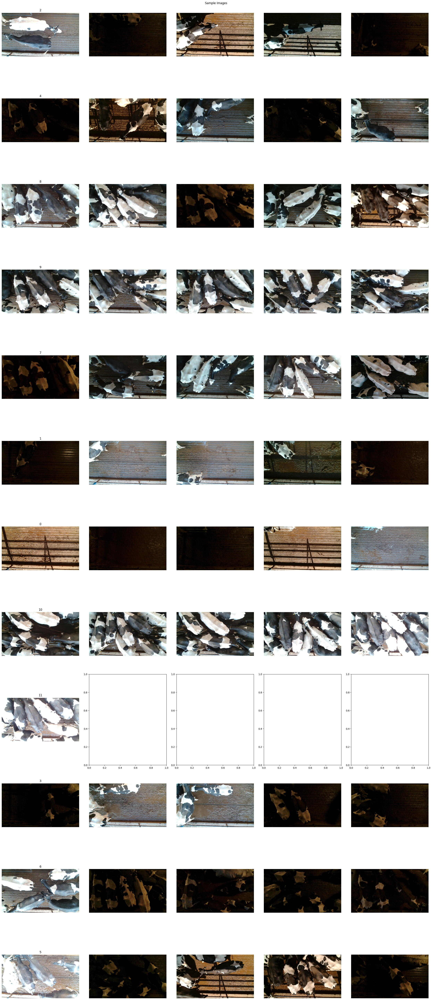

In [145]:
plot_sample_images(image_dir, 5)

## File Size Analysis


In [146]:
def calculate_file_size_stats(image_dir):
    """
    Calculates average, median, and range of file sizes in a directory structure.

    Args:
        image_dir (str): Path to the directory containing images.

    Returns:
        tuple: A tuple containing average file size, median file size, and
               a list of file sizes (in KB).
    """
    file_sizes = []
    for root, _, files in os.walk(image_dir):
        for filename in files:
            file_path = os.path.join(root, filename)
            file_size = os.path.getsize(file_path) / 1024
            file_sizes.append(file_size)
    return np.mean(file_sizes), np.median(file_sizes), file_sizes

In [147]:
avg_size, median_size, file_sizes = calculate_file_size_stats(image_dir)

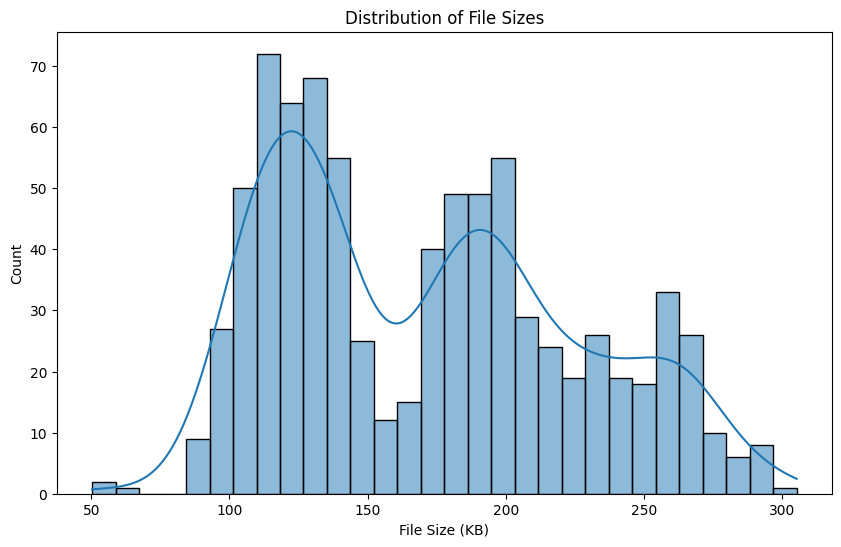

In [148]:
plt.figure(figsize=(10, 6))
sns.histplot(file_sizes, bins=30, kde=True)
plt.title("Distribution of File Sizes")
plt.xlabel("File Size (KB)")
plt.show()

In [149]:
print(f"\nAverage file size: {avg_size:.2f} KB")
print(f"Median file size: {median_size:.2f} KB")
print(f"File size range: {min(file_sizes):.2f} KB to {max(file_sizes):.2f} KB")


Average file size: 171.03 KB
Median file size: 171.72 KB
File size range: 50.33 KB to 305.29 KB
